# **SPEECH PROCESSING PROJECT** 



#TOPIC: Music Genre Classification


Presented by: 

Sunaina Saxena(213070001)

Ayushi Thawait(213070011)


#Introduction


In this project music clips are classified into two different genres
(Fast and Slow). Playlist of 60 songs(30 of each genre) has been created and 3 clips of 30 sec at different time locations from each song has been taken.

Features namely MFCC's, zero crossing rate, spectral centroid, spectral bandwidth, spectral roll-off, spectral contrast are extracted from these clips. Dataset of these extracted features is used to train a machine learning classifier named K-nearest neighbour. 


Different configurations of features are used for classification to know the features which are best suited for our classification task. We have also identified and analysed incorrectly classified music clips.


# **Importing required libraries**

In [1]:
import numpy as np
import os
from google.colab import drive
import IPython.display as ipd
import librosa
import scipy as sp
from scipy import signal
from scipy.fftpack import fft
from scipy.io import wavfile
!pip install pydub
from os import path
from pydub import AudioSegment
import soundfile as sf
import librosa.display
import sklearn
import pandas
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import pandas
import seaborn as sns
%matplotlib inline

In [2]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


#Converting MP3 songs to wav format

In [ ]:
os.chdir("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/Jazz_songs")

audio_files = os.listdir()
# You dont need the number of files in the folder, just iterate over them directly using:
for file in audio_files:
    #spliting the file into the name and the extension
    name, ext = os.path.splitext(file)
    if ext == ".mp3":
       mp3_sound = AudioSegment.from_mp3(file)
       #rename them using the old name + ".wav"
       mp3_sound.export("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/slow_wav/{0}.wav".format(name), format="wav")

In [ ]:
os.chdir("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/rock_songs")

audio_files = os.listdir()
# You dont need the number of files in the folder, just iterate over them directly using:
for file in audio_files:
    #spliting the file into the name and the extension
    name, ext = os.path.splitext(file)
    if ext == ".mp3":
       mp3_sound = AudioSegment.from_mp3(file)
       #rename them using the old name + ".wav"
       mp3_sound.export("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/fast_wav/{0}.wav".format(name), format="wav")

#Getting list of wav songs of each genre

In [3]:
#..............List of slow songs......................................
list_slow = os.listdir("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/slow_wav/")
#..............List of fast songs......................................
list_fast=os.listdir("/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/fast_wav/")

#Making 3 clips of 30sec for each new/fast song

In [ ]:
import random
fs=22050
frame=np.zeros(30*fs)
iter=0
path_1="/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/fast_wav/"
path_2="/content/gdrive/Shareddrives/Speech_processing_project/frames/fast/"
for i in range(0,30):
  y, fs= librosa.load(str(path_1)+list_fast[i], mono = True)
  for j in range(0,3):
    iter+=1
    random_no=random.randint(30,int(y.size/22050))
    frame=y[(random_no-30)*fs:random_no*fs]
    sf.write(path_2 + "fast.{0}.wav".format(iter), frame,fs)   

#Making 3 clips of 30 sec for each slow/old songs 

In [ ]:
frame=np.zeros(30*fs)
iter=0
path_1="/content/gdrive/Shareddrives/Speech_processing_project/songs_playlist/slow_wav/"
path_2="/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
for i in range(0,30):
  y, fs= librosa.load(str(path_1)+list_slow[i], mono = True)
  for j in range(0,3):
    iter+=1
    random_no=random.randint(30,int(y.size/22050))
    frame=y[(random_no-30)*fs:random_no*fs]
    sf.write(path_2 + "slow.{0}.wav".format(iter), frame,fs)


#MUSIC SIGNAL ANALYSIS

In [92]:
#..............List of slow songs......................................
list_fast = os.listdir("/content/gdrive/Shareddrives/Speech_processing_project/frames/fast/")
#..............List of fast songs......................................
list_slow=os.listdir("/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/")

##Loading one clips of 30 sec from each genre for music signal analysis.

Text(0.5, 1.0, 'old/slow')

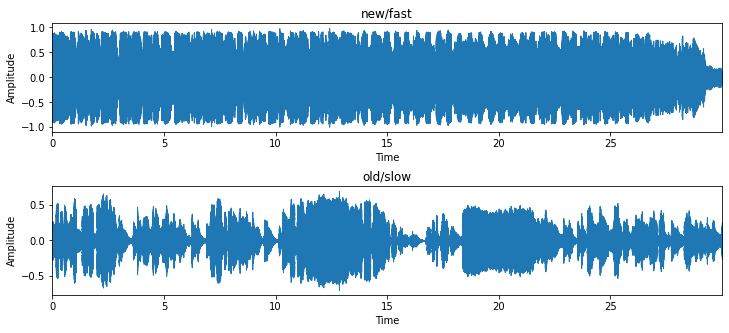

In [93]:
pathAudio_fast = "/content/gdrive/Shareddrives/Speech_processing_project/frames/fast/"
pathAudio_slow=  "/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
y_fast, fs= librosa.load(str(pathAudio_fast)+list_fast[50], mono = True)
y_slow, fs= librosa.load(str(pathAudio_slow)+list_slow[40], mono = True)


fig=plt.figure(figsize=(12,5))
fig.subplots_adjust(hspace=.5)
plt.subplot(2, 1, 1)
plt.xlabel("Time")
plt.ylabel("Amplitude")
librosa.display.waveplot(y_fast,fs)
plt.title('new/fast')

plt.subplot(2, 1, 2)
plt.xlabel("Time")
plt.ylabel("Amplitude")
librosa.display.waveplot(y_slow,fs)
plt.title('old/slow')

###From the time domain representation of both genres, we can make following observations:

1. Fast/New songs have high Amplitude as compared to slow/old songs because fast songs are loud and harsh.

2. Fast/New Songs have high Zero Crossing Rate as compared to slow/old songs because slow/old songs are comparitively smooth and does not have many noisy contents of high frequency.


# Playing one 30 sec clip of fast music

In [94]:
ipd.Audio(y_fast, rate=fs)


# Playing one 30 sec clip of slow music

In [95]:
ipd.Audio(y_slow, rate=fs)

#Plotting MEL spectrogram for the above two audios

* The mel spectrogram remaps the values in hertz to the mel scale according to the following conversion formula:

 $            m=2595\log_{10}(1+\frac{f}{700})                        $

 $              f=700(e^{\frac{m}{2595}}-1)                           $


* Mel spectrograms are better suited for applications that need to model human hearing perception.





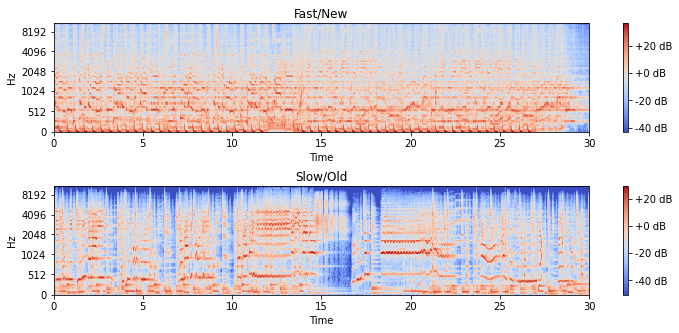

In [ ]:
window_size=2048

fig=plt.figure(figsize=(12,5))
fig.subplots_adjust(hspace=.5)

plt.subplot(2,1,1)
S = librosa.feature.melspectrogram(y_fast, sr=22050, n_fft=window_size)
logS = librosa.power_to_db(S)
plt.title('Fast/New')
librosa.display.specshow(logS, sr=22050, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,2)
S2 = librosa.feature.melspectrogram(y_slow, sr=22050, n_fft=window_size)
logS2 = librosa.power_to_db(S2)
plt.title('Slow/Old')
librosa.display.specshow(logS2, sr=22050, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

###From the Mel-Spectrogram of both genres we can make following observations


* Fast/New Songs spectrum is spread over wide frequency range as Fast/New songs uses many instruments and each instruments corresponds to different frequencies.

* Whereas Slow/old songs uses fewer instruments. Therefore we can see only some of the frequency components. 






# Functions for feature extraction

In [96]:


def get_subdirectories(path):
    return [name for name in os.listdir(path)
            if os.path.isdir(os.path.join(path, name))]



def get_sample_arrays(path, song_name, samp_rate):
    path_of_audios = librosa.util.find_files(path+song)
    audios = []
    for audio in path_of_audios:
        x, sr = librosa.load(audio, sr=samp_rate, duration=30.0)
        audios.append(x)
    audios_numpy = np.array(audios)
    return audios_numpy



def extract_features(signal, sample_rate, frame_size, hop_size):
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y=signal, frame_length=frame_size, hop_length=hop_size)
    spectral_centroid = librosa.feature.spectral_centroid(y=signal, sr=sample_rate, n_fft=frame_size,
                                                          hop_length=hop_size)
    spectral_contrast = librosa.feature.spectral_contrast(y=signal, sr=sample_rate, n_fft=frame_size,
                                                          hop_length=hop_size)
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=signal, sr=sample_rate, n_fft=frame_size,
                                                            hop_length=hop_size)
    spectral_rolloff = librosa.feature.spectral_rolloff(y=signal, sr=sample_rate, n_fft=frame_size, hop_length=hop_size)
    mfccs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_fft=frame_size, hop_length=hop_size)

    return [

        np.mean(zero_crossing_rate),
        np.std(zero_crossing_rate),
        np.mean(spectral_centroid),
        np.std(spectral_centroid),
        np.mean(spectral_contrast),
        np.std(spectral_contrast),
        np.mean(spectral_bandwidth),
        np.std(spectral_bandwidth),
        np.mean(spectral_rolloff),
        np.std(spectral_rolloff),

        np.mean(mfccs[1, :]),
        np.std(mfccs[1, :]),
        np.mean(mfccs[2, :]),
        np.std(mfccs[2, :]),
        np.mean(mfccs[3, :]),
        np.std(mfccs[3, :]),
        np.mean(mfccs[4, :]),
        np.std(mfccs[4, :]),
        np.mean(mfccs[5, :]),
        np.std(mfccs[5, :]),
        np.mean(mfccs[6, :]),
        np.std(mfccs[6, :]),
        np.mean(mfccs[7, :]),
        np.std(mfccs[7, :]),
        np.mean(mfccs[8, :]),
        np.std(mfccs[8, :]),
        np.mean(mfccs[9, :]),
        np.std(mfccs[9, :]),
        np.mean(mfccs[10, :]),
        np.std(mfccs[10, :]),
        np.mean(mfccs[11, :]),
        np.std(mfccs[11, :]),
        np.mean(mfccs[12, :]),
        np.std(mfccs[12, :]),
        np.mean(mfccs[13, :]),
        np.std(mfccs[13, :]),
    ]





#Functions for performing Classification tasks using K Nearest Neighbour algorithm.

In [97]:
def csv(data_set):
  #Here output class is removed from input and train/test split is done 
  X=data_set.drop(['genre'],axis='columns')
  y=data_set.genre
  return X,y


def data_split(data_set):
  X,y=csv(data_set)
  X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.40)
  return X_train,X_test,y_train,y_test



def model(data_set):
  X_train,X_test,y_train,y_test=data_split(data_set)
  #..............Applying KNN model.........................................
  results_knn=[]
  #............iterations for obtaining best k value........................
  for i in range(1,40):
      knn=KNeighborsClassifier(n_neighbors=i)
      knn.fit(X_train,y_train)
      results_knn.append(knn.score(X_test,y_test))
  max_accuracy_knn=max(results_knn)
  best_k=results_knn.index(max(results_knn))
  print("Max Accuracy is {:.3f} on test dataset with {} neighbors.\n".format(max_accuracy_knn,best_k))
  plt.plot(np.arange(1,40),results_knn)
  plt.xlabel("n Neighbors")
  plt.ylabel("Test Accuracy")
  plt.grid()

  #..............Training model with best k value...........................
  knn=KNeighborsClassifier(n_neighbors=best_k)
  knn.fit(X_train,y_train)
  print("Training Score: {:.3f}".format(knn.score(X_train,y_train)))
  print("Test score: {:.3f}".format(knn.score(X_test,y_test)))
  # y_pred = knn.predict(X_test) 
  return X_test,y_test,knn



def confusion_mat(X_test,y_test,knn):
  ax= plt.subplot()
  y_pred = knn.predict(X_test)
  cm = confusion_matrix(y_test, y_pred)
  sns.heatmap(cm, annot=True, fmt='g', ax=ax)
  ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels') 
  ax.set_title('Confusion Matrix') 
  ax.xaxis.set_ticklabels(['fast', 'slow']); ax.yaxis.set_ticklabels(['fast','slow'])
  return y_pred

#**1. Classification of genres according to Zero crossing rate, spectral centroid, spectral contrast, spectral bandwidth, spectral roll-off**

In [8]:
path='/content/gdrive/Shareddrives/Speech_processing_project/frames/'
song_list=get_subdirectories(path)
labels=[]
fs=22050
frame_size=2048
hop_size=512
is_created = False
for song in song_list:
    sample_arrays = get_sample_arrays(path, song, samp_rate=22050)

    for sample_array in sample_arrays:
              row= extract_features(sample_array, fs,frame_size, hop_size)
              row=row[:10]
              if not is_created:
                dataset_numpy = np.array(row)
                is_created = True
              elif is_created:
                dataset_numpy = np.vstack((dataset_numpy, row))

              
              labels.append(song)

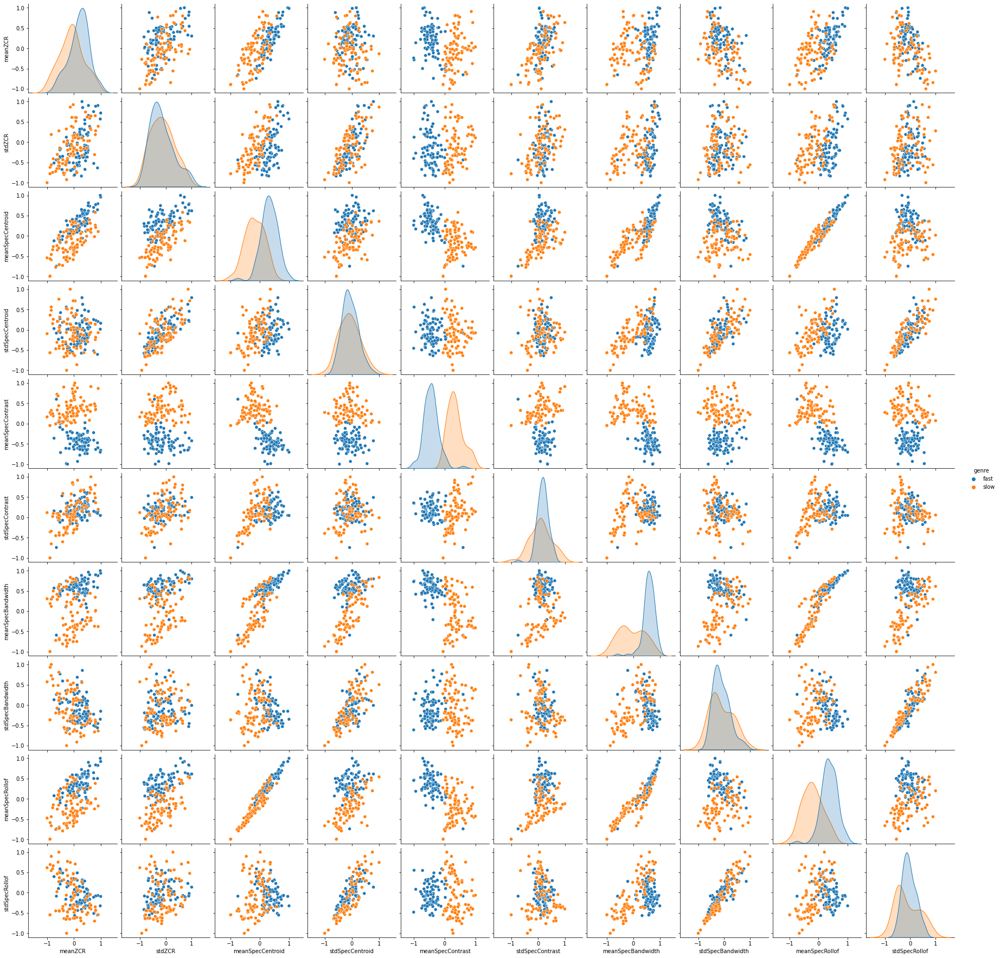

In [99]:
#..................Standardizing the variables..........................
scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
dataset_numpy = scaler.fit_transform(dataset_numpy)

Feature_Names = ['meanZCR', 'stdZCR', 'meanSpecCentroid', 'stdSpecCentroid', 'meanSpecContrast', 'stdSpecContrast',
                     'meanSpecBandwidth', 'stdSpecBandwidth', 'meanSpecRollof', 'stdSpecRollof',]
dataset_pandas = pandas.DataFrame(dataset_numpy, columns=Feature_Names)

dataset_pandas["genre"] = labels
dataset_pandas.to_csv("data_set.csv", index=False)
data_set = pandas.read_csv('data_set.csv',index_col=False)
genre=['fast','slow']
sns.pairplot(data_set,hue='genre')

###From the above pair plot of extracted features of both genres, we can make following observations from diagonal plots:
1. Diagonal plots shows the distribution of given features wrt two genres.

2. Plot of meanZCR verifies that slow/old songs have low zero crossing  rate as compared to fast/New songs. Therefore slow/old songs are comparetively smoother.

2. Plot of meanspecCentroid verifies that fast/New songs have high spectral centroid then slow/old songs which signifies that fast/New songs are more bright and more energy of the signal being concentrated within higher frequencies.

3. Plot of meanspecContrast verifies that slow/old songs have high spectral contrast then fast/New songs which signifies that Slow/old songs are relatively more clear and narrow-band signals than fast/New songs.

4. Plot of meanSpecBandwidth verifies that fast\new songs have more spectral bandwidth than slow\old songs.

5. Spectral Roll off indicates the frequency below which a specified percentage of the total spectral energy (nearly 85%) lies.

6. Plot of meanSpecRolloff verifies that fast\new songs have relatively large spectral Roll off frequency then slow/old songs which signifies that spectral energy of fast/new songs is spread relatively over large frequency range than for slow/old songs.

#Showing information of dataset 

In [100]:
data_set[85:95].style

,meanZCR,stdZCR,meanSpecCentroid,stdSpecCentroid,meanSpecContrast,stdSpecContrast,meanSpecBandwidth,stdSpecBandwidth,meanSpecRollof,stdSpecRollof,genre
85,0.228479,0.189155,0.493883,-0.146695,-0.636923,0.446689,0.651423,-0.275266,0.502587,-0.181850,fast
86,0.098528,-0.731092,0.241763,-0.408934,-0.363156,0.189565,0.635268,-0.269682,0.373596,-0.225308,fast
87,0.280533,-0.837210,0.304227,-0.576706,-0.291337,0.237486,0.646259,-0.556166,0.405178,-0.415100,fast
88,0.135798,-0.272924,0.171033,-0.053145,-0.933106,0.089216,0.419238,0.287228,0.188324,0.084416,fast
89,-0.110979,-0.702132,0.151654,-0.352599,-0.363994,0.171928,0.660383,-0.273723,0.352424,-0.103684,fast
90,0.072696,0.514668,0.327900,0.397397,0.415917,0.319765,0.745465,0.110660,0.483993,0.340111,slow
91,0.050386,0.607991,0.356660,0.712404,0.030144,-0.289831,0.790660,0.355113,0.461096,0.706249,slow
92,-0.134604,0.864259,0.361971,1.000000,0.033527,-0.008518,0.834293,0.504199,0.542772,0.745709,slow
93,-0.240190,0.034153,0.153860,0.504993,0.075252,0.013424,0.735409,0.603314,0.365664,0.772595,slow
94,-0.074198,0.607917,0.281725,0.529580,0.562940,0.033862,0.708232,-0.123305,0.408564,0.298221,slow


##Showing total number of labels for each genre

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


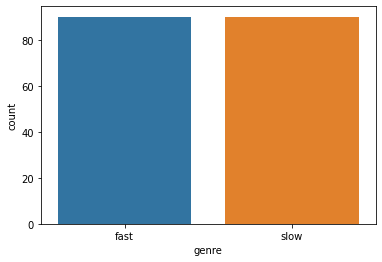

In [ ]:
sns.countplot(data_set['genre'])

## Prediction and evaluation using KNN and identifying best k (number of neighbours) for maximum accuracy

Max Accuracy is 0.931 on test dataset with 5 neighbors.

Training Score: 0.981
Test score: 0.917


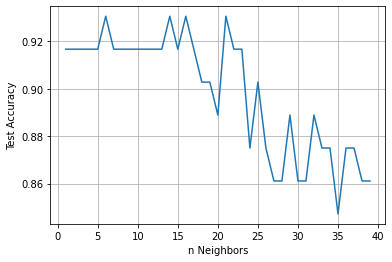

In [108]:

X_test,y_test,knn=model(data_set)


##Plotting confusion matrix for test and predicted labels

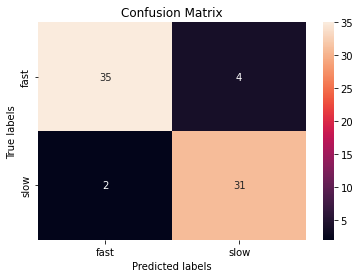

In [109]:
y_pred=confusion_mat(X_test,y_test,knn)

###Confusion matrix shows that 2 clips of slow songs are classified as fast and 4 clips of fast songs are classified as slow. Others are correctly classified.

#**2. Classification of genres according to lower 6 MFCC coefficients.**

In [111]:
path='/content/gdrive/Shareddrives/Speech_processing_project/frames/'
song_list=get_subdirectories(path)
labels=[]

frame_size=2048
hop_size=512
is_created = False
for song in song_list:
    sample_arrays = get_sample_arrays(path, song, samp_rate=22050)

    for sample_array in sample_arrays:
              row= extract_features(sample_array, fs,frame_size, hop_size)
              row=row[10:22]
              if not is_created:
                dataset_numpy1 = np.array(row)
                is_created = True
              elif is_created:
                dataset_numpy1 = np.vstack((dataset_numpy1, row))

              
              labels.append(song)

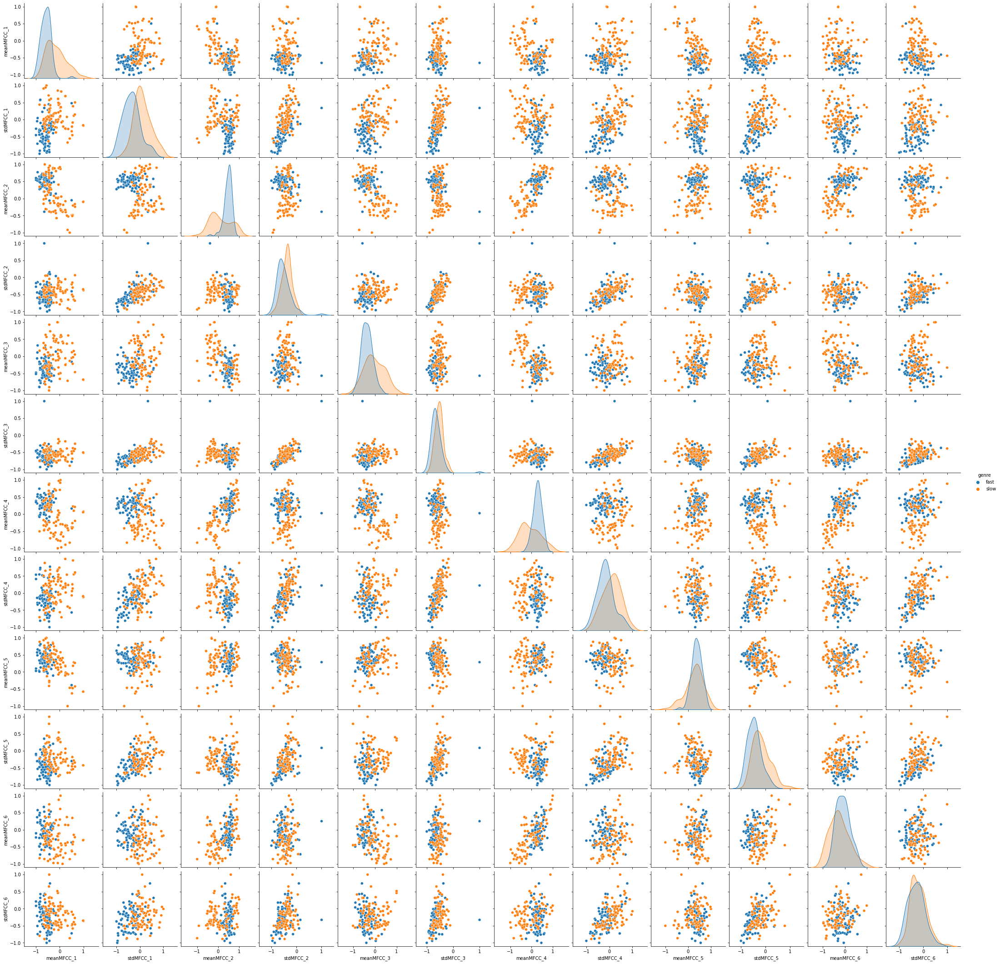

In [112]:
#..................Standardizing the variables..........................
scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
dataset_numpy1 = scaler.fit_transform(dataset_numpy1)

Feature_Names = ['meanMFCC_1', 'stdMFCC_1', 'meanMFCC_2',
                 'stdMFCC_2', 'meanMFCC_3', 'stdMFCC_3','meanMFCC_4', 'stdMFCC_4', 
                 'meanMFCC_5', 'stdMFCC_5', 'meanMFCC_6', 'stdMFCC_6',]
dataset_pandas = pandas.DataFrame(dataset_numpy1, columns=Feature_Names)

dataset_pandas["genre"] = labels
dataset_pandas.to_csv("data_set.csv", index=False)
data_set1=pandas.read_csv('data_set.csv',index_col=False)
GENRES=['fast','slow']
sns.pairplot(data_set1,hue='genre')

#MFCC feature analysis
1. The lower order coefficients contain most of the information about the overall spectral shape of the source-filter transfer function.

2. Higher order coefficients represent increasing levels of spectral details.


#Showing information of dataset

In [ ]:
data_set1[85:95].style

,meanMFCC_1,stdMFCC_1,meanMFCC_2,stdMFCC_2,meanMFCC_3,stdMFCC_3,meanMFCC_4,stdMFCC_4,meanMFCC_5,stdMFCC_5,meanMFCC_6,stdMFCC_6,genre
85,-0.700785,-0.565494,0.371568,-0.654146,-0.500121,-0.610813,0.298736,0.015243,0.526238,-0.616220,-0.116362,-0.514086,fast
86,-0.489874,-0.772653,0.544296,-0.798397,-0.476733,-0.916689,0.391754,-0.616192,0.512686,-0.811628,-0.422350,-0.648827,fast
87,-0.526864,-0.926928,0.524235,-1.000000,-0.473982,-0.835543,0.289998,-0.725489,0.516375,-0.952331,-0.463023,-0.783516,fast
88,-0.381621,-0.182092,0.305621,-0.436248,-0.263913,-0.415267,0.190926,-0.387990,0.475588,-0.713431,0.079876,-0.750260,fast
89,-0.416348,-0.701401,0.637038,-0.816003,-0.513142,-0.816157,0.436759,-0.663881,0.472494,-0.881106,-0.525243,-0.759692,fast
90,-0.603384,-0.137131,0.678758,0.052138,-0.822869,-0.426027,0.414887,0.653356,0.395827,0.214205,0.103001,0.416355,slow
91,-0.448667,0.306207,0.643851,-0.337350,-1.000000,-0.611149,0.234413,-0.219811,-0.410152,0.792666,-0.449565,-0.501847,slow
92,-0.630131,0.423445,1.000000,-0.262862,-0.739553,-0.235190,0.135492,0.882704,0.402098,-0.401162,-0.263671,0.274517,slow
93,-0.418028,0.260178,0.956552,-0.242537,-0.546624,-0.408178,0.407386,0.312930,0.473068,-0.069112,-0.173862,-0.134909,slow
94,-0.687492,-0.017755,0.725545,-0.351044,-0.337133,-0.464470,0.376728,0.201350,0.109574,0.055563,-0.027400,0.070094,slow


## Prediction and evaluation using KNN and identifying best k (number of neighbours) for maximum accuracy

Max Accuracy is 0.903 on test dataset with 7 neighbors.

Training Score: 0.861
Test score: 0.861


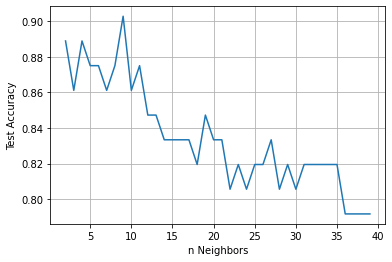

In [ ]:
X_test,y_test,knn=model(data_set1)


##Plotting confusion matrix for test and predicted labels

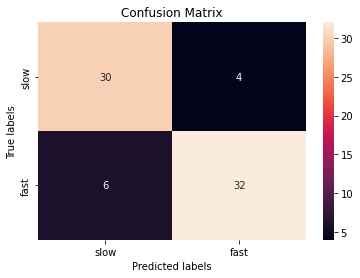

In [ ]:
confusion_mat(X_test,y_test,knn)

#**3. Classification of genres according to higher 7 MFCC coefficients.** 

In [ ]:
path='/content/gdrive/Shareddrives/Speech_processing_project/frames/'
song_list=get_subdirectories(path)
labels=[]

frame_size=2048
hop_size=512
is_created = False
for song in song_list:
    sample_arrays = get_sample_arrays(path, song, samp_rate=22050)

    for sample_array in sample_arrays:
              row= extract_features(sample_array, fs,frame_size, hop_size)
              row=row[22:36]
              if not is_created:
                dataset_numpy2 = np.array(row)
                is_created = True
              elif is_created:
                dataset_numpy2 = np.vstack((dataset_numpy2, row))

              
              labels.append(song)

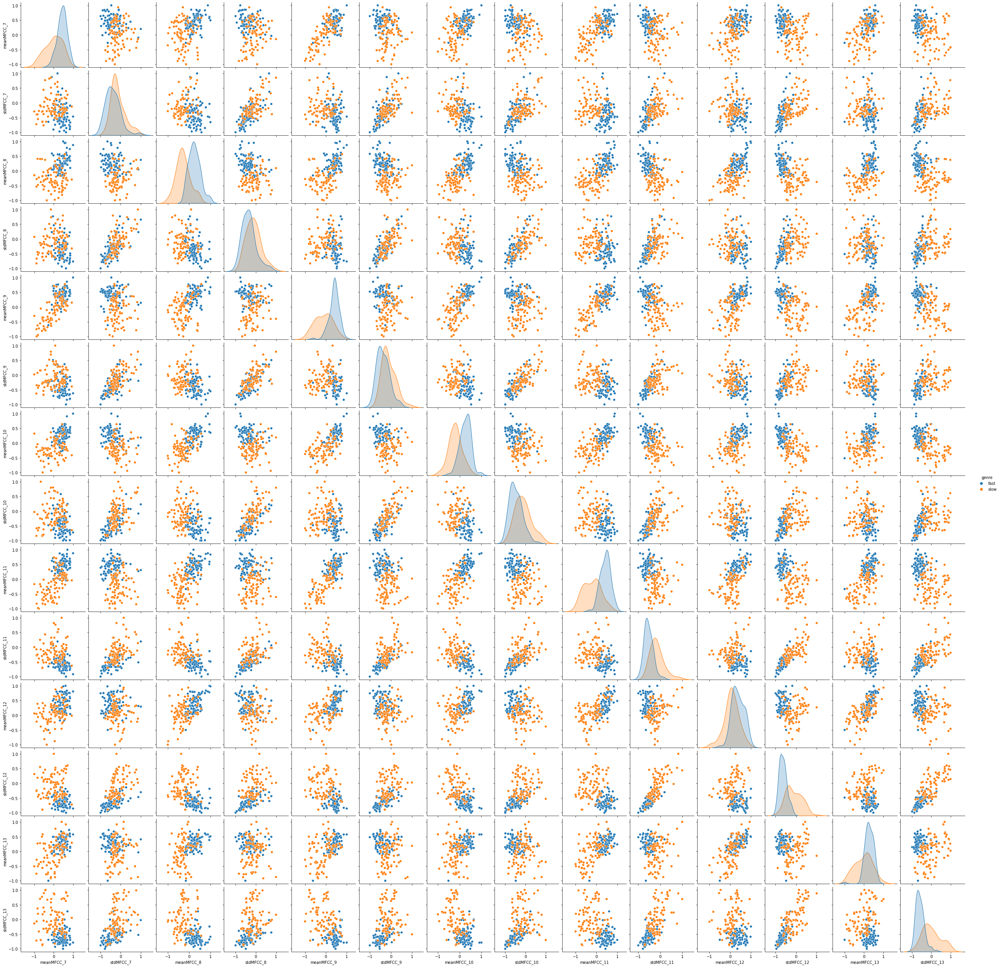

In [ ]:
#..................Standardizing the variables..........................
scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
dataset_numpy2 = scaler.fit_transform(dataset_numpy2)

Feature_Names =['meanMFCC_7', 'stdMFCC_7', 'meanMFCC_8', 'stdMFCC_8', 'meanMFCC_9', 'stdMFCC_9',
                     'meanMFCC_10', 'stdMFCC_10', 'meanMFCC_11', 'stdMFCC_11', 'meanMFCC_12', 'stdMFCC_12',
                     'meanMFCC_13', 'stdMFCC_13']
dataset_pandas = pandas.DataFrame(dataset_numpy2, columns=Feature_Names)

dataset_pandas["genre"] = labels
dataset_pandas.to_csv("data_set.csv", index=False)
data_set2=pandas.read_csv('data_set.csv',index_col=False)
GENRES=['fast','slow']
sns.pairplot(data_set2,hue='genre')

#Showing information of dataset

In [ ]:
data_set2[85:95].style

,meanMFCC_7,stdMFCC_7,meanMFCC_8,stdMFCC_8,meanMFCC_9,stdMFCC_9,meanMFCC_10,stdMFCC_10,meanMFCC_11,stdMFCC_11,meanMFCC_12,stdMFCC_12,meanMFCC_13,stdMFCC_13,genre
85,0.452102,-0.456100,0.158726,-0.557942,0.622098,-0.494812,0.425744,-0.857136,0.699690,-0.572168,0.791842,-0.747043,0.595012,-0.714736,fast
86,0.297420,-0.715082,0.561549,-0.721034,0.348313,-0.717642,0.041574,-0.909710,0.124770,-0.747989,0.211852,-0.670484,0.141889,-0.778995,fast
87,-0.014295,-0.906646,0.528387,-0.587571,0.547212,-0.711035,-0.118887,-0.627098,0.003626,-0.678834,0.135337,-0.723734,0.215513,-0.796141,fast
88,0.415724,-0.640944,0.505086,-0.940205,0.531680,-0.687177,0.578121,-0.694314,0.437745,-0.877224,0.702637,-0.950772,0.340094,-0.756217,fast
89,0.073005,-0.746144,0.208577,-0.696503,0.384857,-0.541357,0.233827,-0.908237,0.183805,-0.699279,0.098926,-0.892566,0.143430,-0.932492,fast
90,0.147264,0.277234,-0.060393,0.042757,0.693480,0.379183,-0.360297,0.050701,-0.297384,-0.139686,0.002871,-0.030431,0.223234,-0.032127,slow
91,-0.666503,-0.121508,-0.379553,-0.214832,-0.054934,0.156225,-0.600569,1.000000,-0.247092,-0.077073,-0.384332,-0.529199,-0.362595,-0.703299,slow
92,-0.343355,0.130962,-0.278340,0.114279,0.154150,0.318245,0.123733,0.249211,-0.264261,-0.247534,-0.507187,0.044811,-0.133838,-0.444378,slow
93,0.078964,-0.336209,0.188696,-0.050785,0.322331,1.000000,0.039319,0.674725,0.018033,-0.175440,-0.038698,0.025931,0.185361,-0.510379,slow
94,-0.358440,-0.281541,-1.000000,-0.194859,-0.105978,0.021067,-0.434292,-0.192091,-0.375509,-0.250411,-1.000000,-0.409288,-0.476470,-0.078766,slow


## Prediction and evaluation using KNN and identifying best k (number of neighbours) for maximum accuracy

Max Accuracy is 0.903 on test dataset with 15 neighbors.

Training Score: 0.852
Test score: 0.889


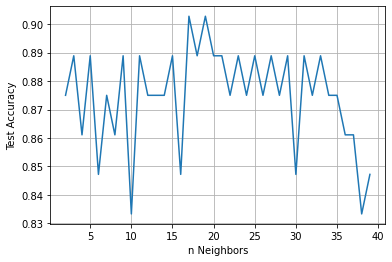

In [ ]:
X_test,y_test,knn=model(data_set2)

##Plotting confusion matrix for test and predicted labels

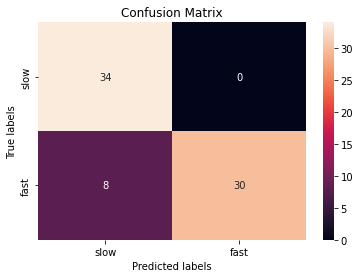

In [ ]:
confusion_mat(X_test,y_test,knn)

#**4. Classification of genres by taking all the extracted features together.** 

In [67]:
path='/content/gdrive/Shareddrives/Speech_processing_project/frames/'
song_list=get_subdirectories(path)
labels=[]

frame_size=2048
hop_size=512
is_created = False
for song in song_list:
    sample_arrays = get_sample_arrays(path, song, samp_rate=22050)

    for sample_array in sample_arrays:
              row= extract_features(sample_array, fs,frame_size, hop_size)
              if not is_created:
                dataset_numpy3 = np.array(row)
                is_created = True
              elif is_created:
                dataset_numpy3 = np.vstack((dataset_numpy3, row))

              
              labels.append(song)

In [123]:
#..................Standardizing the variables..........................
scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
dataset_numpy3 = scaler.fit_transform(dataset_numpy3)

Feature_Names = ['meanZCR', 'stdZCR', 'meanSpecCentroid', 'stdSpecCentroid', 'meanSpecContrast', 'stdSpecContrast',
                     'meanSpecBandwidth', 'stdSpecBandwidth', 'meanSpecRollof', 'stdSpecRollof',
                     'meanMFCC_1', 'stdMFCC_1', 'meanMFCC_2', 'stdMFCC_2', 'meanMFCC_3', 'stdMFCC_3',
                     'meanMFCC_4', 'stdMFCC_4', 'meanMFCC_5', 'stdMFCC_5', 'meanMFCC_6', 'stdMFCC_6',
                     'meanMFCC_7', 'stdMFCC_7', 'meanMFCC_8', 'stdMFCC_8', 'meanMFCC_9', 'stdMFCC_9',
                     'meanMFCC_10', 'stdMFCC_10', 'meanMFCC_11', 'stdMFCC_11', 'meanMFCC_12', 'stdMFCC_12',
                     'meanMFCC_13', 'stdMFCC_13'
                     ]
dataset_pandas = pandas.DataFrame(dataset_numpy3, columns=Feature_Names)
dataset_pandas["genre"] = labels
dataset_pandas.to_csv("data_set.csv", index=False)
data_set3=pandas.read_csv('data_set.csv',index_col=False)
GENRES=['fast','slow']

#Showing information of dataset

In [114]:
data_set3[85:95].style

,meanZCR,stdZCR,meanSpecCentroid,stdSpecCentroid,meanSpecContrast,stdSpecContrast,meanSpecBandwidth,stdSpecBandwidth,meanSpecRollof,stdSpecRollof,meanMFCC_1,stdMFCC_1,meanMFCC_2,stdMFCC_2,meanMFCC_3,stdMFCC_3,meanMFCC_4,stdMFCC_4,meanMFCC_5,stdMFCC_5,meanMFCC_6,stdMFCC_6,meanMFCC_7,stdMFCC_7,meanMFCC_8,stdMFCC_8,meanMFCC_9,stdMFCC_9,meanMFCC_10,stdMFCC_10,meanMFCC_11,stdMFCC_11,meanMFCC_12,stdMFCC_12,meanMFCC_13,stdMFCC_13,genre
85,0.228479,0.189155,0.493883,-0.146695,-0.636923,0.446689,0.651423,-0.275266,0.502587,-0.181850,-0.700785,-0.565494,0.371569,-0.654146,-0.500121,-0.610813,0.298736,0.015243,0.526238,-0.616220,-0.116362,-0.514086,0.452102,-0.456100,0.158726,-0.557942,0.622098,-0.494812,0.425744,-0.857136,0.699690,-0.572168,0.791842,-0.747043,0.595012,-0.714736,fast
86,0.098528,-0.731092,0.241763,-0.408934,-0.363156,0.189565,0.635268,-0.269682,0.373596,-0.225308,-0.489874,-0.772653,0.544296,-0.798397,-0.476733,-0.916689,0.391754,-0.616192,0.512686,-0.811628,-0.422350,-0.648827,0.297420,-0.715082,0.561549,-0.721034,0.348313,-0.717641,0.041574,-0.909710,0.124770,-0.747989,0.211852,-0.670484,0.141889,-0.778995,fast
87,0.280533,-0.837210,0.304227,-0.576706,-0.291337,0.237486,0.646259,-0.556166,0.405178,-0.415100,-0.526864,-0.926928,0.524235,-1.000000,-0.473982,-0.835543,0.289998,-0.725489,0.516375,-0.952331,-0.463023,-0.783516,-0.014295,-0.906646,0.528387,-0.587571,0.547212,-0.711035,-0.118887,-0.627098,0.003626,-0.678834,0.135337,-0.723734,0.215513,-0.796141,fast
88,0.135798,-0.272924,0.171033,-0.053145,-0.933106,0.089216,0.419238,0.287228,0.188324,0.084416,-0.381621,-0.182092,0.305621,-0.436248,-0.263913,-0.415267,0.190926,-0.387989,0.475588,-0.713431,0.079876,-0.750260,0.415724,-0.640944,0.505086,-0.940205,0.531680,-0.687177,0.578121,-0.694314,0.437745,-0.877224,0.702637,-0.950772,0.340094,-0.756217,fast
89,-0.110979,-0.702132,0.151654,-0.352599,-0.363994,0.171928,0.660383,-0.273723,0.352424,-0.103684,-0.416348,-0.701401,0.637038,-0.816003,-0.513142,-0.816157,0.436759,-0.663881,0.472494,-0.881106,-0.525243,-0.759692,0.073005,-0.746143,0.208577,-0.696503,0.384857,-0.541357,0.233827,-0.908237,0.183805,-0.699279,0.098926,-0.892566,0.143430,-0.932492,fast
90,0.072696,0.514668,0.327900,0.397397,0.415917,0.319765,0.745465,0.110660,0.483993,0.340111,-0.603384,-0.137131,0.678758,0.052138,-0.822869,-0.426027,0.414887,0.653356,0.395827,0.214205,0.103001,0.416355,0.147265,0.277234,-0.060393,0.042757,0.693480,0.379183,-0.360297,0.050701,-0.297384,-0.139686,0.002871,-0.030431,0.223234,-0.032127,slow
91,0.050386,0.607991,0.356660,0.712404,0.030144,-0.289831,0.790660,0.355113,0.461096,0.706249,-0.448667,0.306207,0.643851,-0.337350,-1.000000,-0.611149,0.234413,-0.219811,-0.410152,0.792666,-0.449565,-0.501847,-0.666503,-0.121508,-0.379553,-0.214832,-0.054934,0.156225,-0.600569,1.000000,-0.247092,-0.077073,-0.384332,-0.529199,-0.362595,-0.703299,slow
92,-0.134604,0.864259,0.361971,1.000000,0.033527,-0.008518,0.834293,0.504199,0.542772,0.745709,-0.630132,0.423445,1.000000,-0.262862,-0.739553,-0.235190,0.135492,0.882704,0.402098,-0.401163,-0.263671,0.274517,-0.343355,0.130962,-0.278340,0.114278,0.154150,0.318245,0.123733,0.249211,-0.264261,-0.247533,-0.507187,0.044811,-0.133838,-0.444378,slow
93,-0.240190,0.034153,0.153860,0.504993,0.075252,0.013424,0.735409,0.603314,0.365664,0.772595,-0.418028,0.260178,0.956552,-0.242537,-0.546624,-0.408178,0.407386,0.312930,0.473068,-0.069112,-0.173862,-0.134909,0.078964,-0.336209,0.188696,-0.050785,0.322331,1.000000,0.039319,0.674725,0.018033,-0.175440,-0.038698,0.025931,0.185360,-0.510379,slow
94,-0.074198,0.607917,0.281725,0.529580,0.562940,0.033862,0.708232,-0.123305,0.408564,0.298221,-0.687492,-0.017755,0.725545,-0.351044,-0.337134,-0.464470,0.376728,0.201351,0.109574,0.055563,-0.027400,0.070094,-0.358439,-0.281540,-1.000000,-0.194859,-0.105978,0.021067,-0.434292,-0.192091,-0.375509,-0.250411,-1.000000,-0.409288,-0.476470,-0.078766,slow


## Prediction and evaluation using KNN and identifying best k (number of neighbours) for maximum accuracy

Max Accuracy is 0.972 on test dataset with 6 neighbors.

Training Score: 0.963
Test score: 0.944


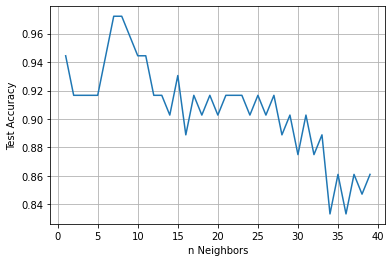

In [129]:
X_test,y_test,knn=model(data_set3)

##Plotting confusion matrix for test and predicted labels

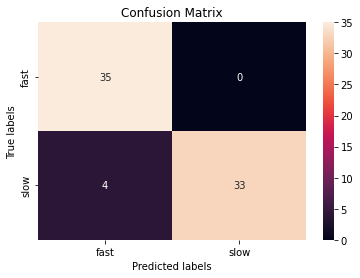

In [130]:
y_pred=confusion_mat(X_test,y_test,knn)

#Identifying  and analysing songs which are incorrectly classified when we are using all features together.

In [141]:
Y_pred=[]
Y_test=[]
for i in range(len(y_test)):
    Y_pred.append(y_pred[i])
Y_pred=np.array(y_pred)
Y_test=np.array(y_test)
for i in range(len(Y_pred)):
  if Y_pred[i]!=Y_test[i]:
    print(i)
    print('Predicted label:',Y_pred[i])
    print('Actual label:',Y_test[i])

9
Predicted label: fast
Actual label: slow
37
Predicted label: fast
Actual label: slow
56
Predicted label: fast
Actual label: slow
57
Predicted label: fast
Actual label: slow


#Getting actual list of songs which are incorrectly classified by KNN

In [143]:
print(X_test[9:10]);print(X_test[37:38]);print(X_test[56:57]);print(X_test[57:58])



      meanZCR   stdZCR  meanSpecCentroid  ...  stdMFCC_12  meanMFCC_13  stdMFCC_13
153  0.089506  0.60539          0.152133  ...   -0.701441     0.124025   -0.206047

[1 rows x 36 columns]
      meanZCR    stdZCR  meanSpecCentroid  ...  stdMFCC_12  meanMFCC_13  stdMFCC_13
103 -0.543403 -0.506495         -0.010661  ...   -0.625605     0.145258   -0.557553

[1 rows x 36 columns]
      meanZCR    stdZCR  meanSpecCentroid  ...  stdMFCC_12  meanMFCC_13  stdMFCC_13
141  0.255591 -0.210162          0.057015  ...    0.001937    -0.028644   -0.013299

[1 rows x 36 columns]
     meanZCR  stdZCR  meanSpecCentroid  ...  stdMFCC_12  meanMFCC_13  stdMFCC_13
134     -1.0    -1.0         -0.540554  ...   -0.691597     0.574828   -0.156754

[1 rows x 36 columns]


##Getting actual index of wrongly classified clips from our dataset

Total music clips=180

Slow music clips= 90

Fast music clips= 90

For our dataset,

When incorrectly classified index is greater than or equal to 90, we get the actual clip index of the wrong classified clip as-


 Actual clip index = Index - 90 - 1    

When incorrectly classified index is less than 90, we get the actual clip index of the wrong classified clip as-

 Actual clip index = Index - 1


here, we got first incorrectly classified index as 153,
Actual clip index = (153-90-1) = 62

similarly,

(103-90-1) = 12

(141-90-1) = 50

(134-90-1) = 43


In [146]:
pathAudio_fast = "/content/gdrive/Shareddrives/Speech_processing_project/frames/fast/"
pathAudio_slow=  "/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
# y_fast, fs= librosa.load(str(pathAudio_fast)+list_fast[50], mono = True)
y_slow, fs= librosa.load(str(pathAudio_slow)+list_slow[62], mono = True)
ipd.Audio(y_slow, rate=fs)

In [147]:
pathAudio_slow=  "/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
# y_fast, fs= librosa.load(str(pathAudio_fast)+list_fast[50], mono = True)
y_slow, fs= librosa.load(str(pathAudio_slow)+list_slow[12], mono = True)
ipd.Audio(y_slow, rate=fs)

In [148]:
pathAudio_slow=  "/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
# y_fast, fs= librosa.load(str(pathAudio_fast)+list_fast[50], mono = True)
y_slow, fs= librosa.load(str(pathAudio_slow)+list_slow[50], mono = True)
ipd.Audio(y_slow, rate=fs)

In [149]:
pathAudio_slow=  "/content/gdrive/Shareddrives/Speech_processing_project/frames/slow/"
# y_fast, fs= librosa.load(str(pathAudio_fast)+list_fast[50], mono = True)
y_slow, fs= librosa.load(str(pathAudio_slow)+list_slow[43], mono = True)
ipd.Audio(y_slow, rate=fs)

#Observations
As we have taken a random 30 sec music clips from the bollywood songs and the bollywood songs are known for using a wide variety of accompaniments in a single song.

So after playing above wrongly classified clips, we observed that in these particular clips certain instruments are used which might not be used in the whole song, so they may be misleading our model during classification, which can be the case for above wrongly classified clips.

We have done this analysis only when all the features are used together for classification because we are getting maximum accuracy in this case.

#**Performance Analysis for all the 4 configurations of features.**


Four configurations are as follows:-

1. Classification using Zero crossing rate, spectral centroid, spectral contrast, spectral bandwidth, spectral roll-off.

2. Classification using lower 6 MFCC coefficients.
3. Classification using higher 7 MFCC coefficients.
4. Classification using all the features together.


* From the above 4 configurations we are getting comparatively better accuracy for first and fourth configuration.

* From this we can conclude that for music genre classification, the features used in first configuration are more important as compared to MFCC coefficients.

* Also from the diagonal plots we can observe that the features used in first configuration are having well seperated distribution for each genre.

* As far as most important features are concerned, it is evident from the diagonal plots that meanSpecContrast,	meanSpecBandwidth and meanSpecRollof are the most important features.





##References
https://github.com/alikaratana/Music-Genre-Classification


In [ ]:
%%shell
jupyter nbconvert --to html /content/Spech_project.ipynb

[NbConvertApp] Converting notebook /content/Spech_project.ipynb to html
[NbConvertApp] Writing 11549036 bytes to /content/Spech_project.html
